## This notebook aims to answer the follwing questions -:
- What is the distribution of sales for each geographical region and are there any specific products which drives the revenue or have a higher profit especially in cases where the customer share is low
- What are the most ordered products in general?
- Can we find mutually dependant buying patterns (Association Rule mining)?
- How does the company perform with time. Are they gaining customers or revenue?
- What are the possible ways to segment customers for efficient targeting and what are the possible ways for efficient marketing?
- Are there efficient ways for inventory managment?


In [1]:
import numpy as np
import pandas as pd 
import os

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

import warnings
warnings.filterwarnings('ignore')

from sklearn.cluster import KMeans

from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules

In [2]:
# specify encoding to deal with different formats
df = pd.read_csv('../input/ecommerce-data/data.csv', encoding = 'ISO-8859-1')
print(df)


       InvoiceNo StockCode                          Description  Quantity  \
0         536365    85123A   WHITE HANGING HEART T-LIGHT HOLDER         6   
1         536365     71053                  WHITE METAL LANTERN         6   
2         536365    84406B       CREAM CUPID HEARTS COAT HANGER         8   
3         536365    84029G  KNITTED UNION FLAG HOT WATER BOTTLE         6   
4         536365    84029E       RED WOOLLY HOTTIE WHITE HEART.         6   
...          ...       ...                                  ...       ...   
541904    581587     22613          PACK OF 20 SPACEBOY NAPKINS        12   
541905    581587     22899         CHILDREN'S APRON DOLLY GIRL          6   
541906    581587     23254        CHILDRENS CUTLERY DOLLY GIRL          4   
541907    581587     23255      CHILDRENS CUTLERY CIRCUS PARADE         4   
541908    581587     22138        BAKING SET 9 PIECE RETROSPOT          3   

            InvoiceDate  UnitPrice  CustomerID         Country  
0        1

In [3]:
print(df.dtypes)

InvoiceNo       object
StockCode       object
Description     object
Quantity         int64
InvoiceDate     object
UnitPrice      float64
CustomerID     float64
Country         object
dtype: object


Some attributes of the data

```
InvoiceNo: Invoice number. Nominal, a 6-digit integral number uniquely assigned to each transaction. If this code starts with letter 'c', it indicates a cancellation.
StockCode: Product (item) code. Nominal, a 5-digit integral number uniquely assigned to each distinct product.
Description: Product (item) name. Nominal.
Quantity: The quantities of each product (item) per transaction. Numeric.
InvoiceDate: Invice Date and time. Numeric, the day and time when each transaction was generated.
UnitPrice: Unit price. Numeric, Product price per unit in sterling.
CustomerID: Customer number. Nominal, a 5-digit integral number uniquely assigned to each customer.
Country: Country name. Nominal, the name of the country where each customer resides.
```

# Data cleaning

- Before I go further, I recieved a lot of interesting ideas from the notebook "https://www.kaggle.com/anmoltripathi/complete-e-commerce-analysis" especially on data cleaning, I will be using some of the ideas from that notebook here

In [4]:
df.describe()

,Quantity,UnitPrice,CustomerID
count,541909.000000,541909.000000,406829.000000
mean,9.552250,4.611114,15287.690570
std,218.081158,96.759853,1713.600303
min,-80995.000000,-11062.060000,12346.000000
25%,1.000000,1.250000,13953.000000
50%,3.000000,2.080000,15152.000000
75%,10.000000,4.130000,16791.000000
max,80995.000000,38970.000000,18287.000000


- As we can see some of the numerical fields are negative. This could be due to erronous values or refunds 
- This can be checked by comparing whether there are any duplicate invoice numbers or cancellations
- Letter c indicates cancellations in Invoice number. Lets check that. 

In [5]:
Cancellations = []

for i in range(len(df)):
    
    if "c" in df["InvoiceNo"].loc[i] or "C" in df["InvoiceNo"].loc[i] :
        
        Cancellations.append(1)
        
    else:
        pass

print("No of cancellations: ", len(Cancellations))

No of cancellations:  9288


In [6]:
df['InvoiceDate']= pd.to_datetime(df['InvoiceDate'])

df.set_index(np.arange(0,len(df),1),inplace=True)
neg_df = df[df["Quantity"]<0]
pos_df = df[~df["Quantity"]<0]

print("No of total negative quantity: ",len(neg_df))

No of total negative quantity:  10624


In [7]:
neg_df.head(50)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
141,C536379,D,Discount,-1,2010-12-01 09:41:00,27.50,14527.0,United Kingdom
154,C536383,35004C,SET OF 3 COLOURED FLYING DUCKS,-1,2010-12-01 09:49:00,4.65,15311.0,United Kingdom
235,C536391,22556,PLASTERS IN TIN CIRCUS PARADE,-12,2010-12-01 10:24:00,1.65,17548.0,United Kingdom
236,C536391,21984,PACK OF 12 PINK PAISLEY TISSUES,-24,2010-12-01 10:24:00,0.29,17548.0,United Kingdom
237,C536391,21983,PACK OF 12 BLUE PAISLEY TISSUES,-24,2010-12-01 10:24:00,0.29,17548.0,United Kingdom
238,C536391,21980,PACK OF 12 RED RETROSPOT TISSUES,-24,2010-12-01 10:24:00,0.29,17548.0,United Kingdom
239,C536391,21484,CHICK GREY HOT WATER BOTTLE,-12,2010-12-01 10:24:00,3.45,17548.0,United Kingdom
240,C536391,22557,PLASTERS IN TIN VINTAGE PAISLEY,-12,2010-12-01 10:24:00,1.65,17548.0,United Kingdom
241,C536391,22553,PLASTERS IN TIN SKULLS,-24,2010-12-01 10:24:00,1.65,17548.0,United Kingdom
939,C536506,22960,JAM MAKING SET WITH JARS,-6,2010-12-01 12:38:00,4.25,17897.0,United Kingdom


Cancellations could amount to the negative quantity. Let's check for refunds. These can happen for
- Quantity lower than total bought quantity
- Bought after the purchase date
- Same customer id

In [8]:
check_for_truth = []

for j in neg_df.index:  
    
        for_ref = pos_df[(neg_df["CustomerID"].loc[j]==pos_df["CustomerID"]) & \
        (neg_df["Description"].loc[j]==pos_df["Description"])\
         &  (neg_df["InvoiceDate"].loc[j]>pos_df["InvoiceDate"]) & \
         (abs(neg_df["Quantity"].loc[j])<=pos_df["Quantity"])]
        
        if len(for_ref)>0:
            print("Refunds exists")
            break    
        
        


Refunds exists


### Let's check which items contribute to the most refunds

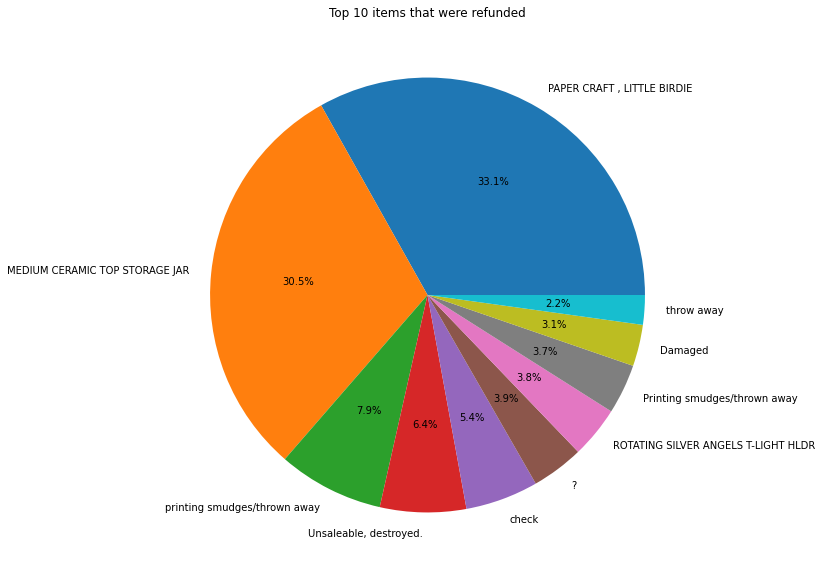

In [9]:
df_neg = neg_df[['Quantity','Description']].groupby("Description").sum()
df_neg["Quantity"] = abs(df_neg["Quantity"])

plt.figure(figsize=(10,10))
df_neg = df_neg.nlargest(10,columns="Quantity")
plt.title("Top 10 items that were refunded")
plt.pie(df_neg["Quantity"].to_list(),labels=df_neg.index,autopct='%1.1f%%')
plt.show()

- Paper craft little birdie along with medium ceramic top storage jar are the most refunded
- Refunded item details will not be deleted from the dataframe as they are vital later for correctly finding the revenue retention
- Additionally there are items mentioned as unsaleable, destroyed, printing smudges/thrown away which don't point to a specific item. These can be checked with stockcode

In [10]:
print(df[df.Description=="printing smudges/thrown away"])

print(df[df.Description=="Unsaleable, destroyed."])

print(df[df.Description=="check"])

       InvoiceNo StockCode                   Description  Quantity  \
225529    556690     23005  printing smudges/thrown away     -9600   
225530    556691     23005  printing smudges/thrown away     -9600   

               InvoiceDate  UnitPrice  CustomerID         Country  
225529 2011-06-14 10:37:00        0.0         NaN  United Kingdom  
225530 2011-06-14 10:37:00        0.0         NaN  United Kingdom  
       InvoiceNo StockCode             Description  Quantity  \
431375    573590    79323G  Unsaleable, destroyed.      -657   
431376    573591    79323B  Unsaleable, destroyed.     -1671   
431377    573592   79323GR  Unsaleable, destroyed.     -1158   
431378    573593   79323LP  Unsaleable, destroyed.     -2618   
431379    573594    79323P  Unsaleable, destroyed.     -2003   
431380    573595    79323S  Unsaleable, destroyed.      -674   
431381    573596    79323W  Unsaleable, destroyed.     -4830   
431382    573597     79341  Unsaleable, destroyed.      -905   
431383   

- Since, they lack a CustomerID, they could be refunds at the company level i.e. refunds during purchase from the supplier
- Let's delete null values and find correctly the items that were refunded

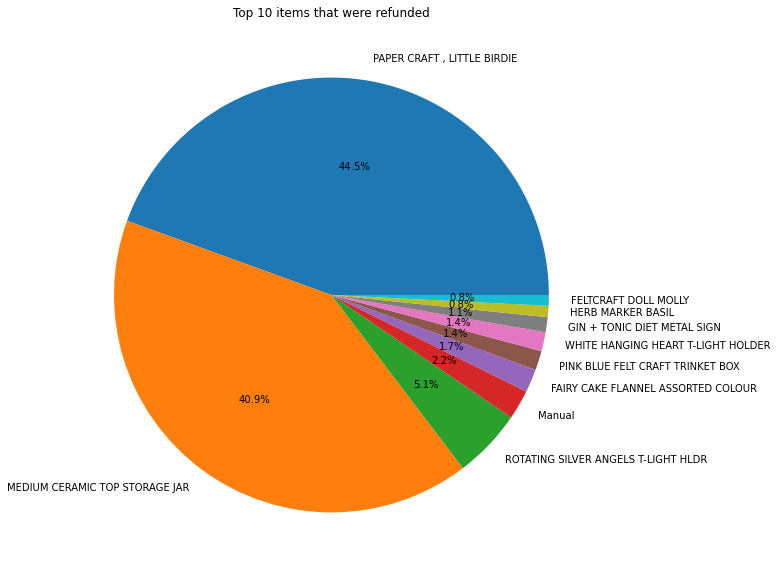

In [11]:
neg_df.Description = neg_df.Description.astype(str)
neg_df["Description"] = neg_df["Description"].apply(lambda x:np.nan if x.lower() == "nan" else x)
neg_df.dropna(inplace=True)

df_neg = neg_df[['Quantity','Description']].groupby("Description").sum()
df_neg["Quantity"] = abs(df_neg["Quantity"])

plt.figure(figsize=(10,10))
df_neg = df_neg.nlargest(10,columns="Quantity")
plt.title("Top 10 items that were refunded")
plt.pie(df_neg["Quantity"].to_list(),labels=df_neg.index,autopct='%1.1f%%')
plt.show()

- Null values need to be deleted later
- What's manual?

In [12]:
print(df[df.Description=="Manual"])

print(df[(df.InvoiceNo=="536569") & (df.CustomerID==16274)])

       InvoiceNo StockCode Description  Quantity         InvoiceDate  \
2239      536569         M      Manual         1 2010-12-01 15:35:00   
2250      536569         M      Manual         1 2010-12-01 15:35:00   
5684      536865         M      Manual         1 2010-12-03 11:28:00   
6798      536981         M      Manual         2 2010-12-03 14:26:00   
7976      537077         M      Manual        12 2010-12-05 11:59:00   
...          ...       ...         ...       ...                 ...   
531432    580956         M      Manual         4 2011-12-06 14:23:00   
533082   C581009         M      Manual        -1 2011-12-07 09:15:00   
534308   C581145         M      Manual        -1 2011-12-07 13:48:00   
538321    581405         M      Manual         3 2011-12-08 13:50:00   
541541   C581499         M      Manual        -1 2011-12-09 10:28:00   

        UnitPrice  CustomerID         Country  
2239         1.25     16274.0  United Kingdom  
2250        18.95     16274.0  United K

- Analysing the stock code later can be helpful

- Let's check for negative price

In [13]:
neg_price = df[df["UnitPrice"]<0]
print(neg_price)

       InvoiceNo StockCode      Description  Quantity         InvoiceDate  \
299983   A563186         B  Adjust bad debt         1 2011-08-12 14:51:00   
299984   A563187         B  Adjust bad debt         1 2011-08-12 14:52:00   

        UnitPrice  CustomerID         Country  
299983  -11062.06         NaN  United Kingdom  
299984  -11062.06         NaN  United Kingdom  


- Since this does not count as a customer, let's delete it 

In [14]:
df = df[df["UnitPrice"]>0]

- Remove possible duplicates and check for null values

In [15]:
df = df.drop_duplicates(keep='first')
df.isnull().sum()

InvoiceNo           0
StockCode           0
Description         0
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     132565
Country             0
dtype: int64

- From above, some descriptions are NaN, but they don't appear here.
- Maybe they are text, let's find them and convert them to null values

In [16]:
df["Description"] = df["Description"].apply(lambda x:np.nan if x.lower() == "nan" else x)
print(df.isnull().sum()) # Seems to be zero for zero unit price

InvoiceNo           0
StockCode           0
Description         0
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     132565
Country             0
dtype: int64


In [17]:
print(df[df["CustomerID"].isna()])

       InvoiceNo StockCode                      Description  Quantity  \
1443      536544     21773  DECORATIVE ROSE BATHROOM BOTTLE         1   
1444      536544     21774  DECORATIVE CATS BATHROOM BOTTLE         2   
1445      536544     21786               POLKADOT RAIN HAT          4   
1446      536544     21787            RAIN PONCHO RETROSPOT         2   
1447      536544     21790               VINTAGE SNAP CARDS         9   
...          ...       ...                              ...       ...   
541536    581498    85099B          JUMBO BAG RED RETROSPOT         5   
541537    581498    85099C   JUMBO  BAG BAROQUE BLACK WHITE         4   
541538    581498     85150    LADIES & GENTLEMEN METAL SIGN         1   
541539    581498     85174                S/4 CACTI CANDLES         1   
541540    581498       DOT                   DOTCOM POSTAGE         1   

               InvoiceDate  UnitPrice  CustomerID         Country  
1443   2010-12-01 14:32:00       2.51         NaN  Unit

- This could probably be customers whose details have not been taken down
- To ensure our analysis are correct, drop rows with null values throughout
- Additionally some items are coded less than 5, they seem to some kind of delivery charge

In [18]:
# String nan
columns = ["InvoiceNo","StockCode","Country","Description"]
for column in columns:
    print(column)
    df[column] = df[column].apply(lambda x:np.nan if x.lower=="nan" else x)   
  
df.dropna(inplace=True)
print(df)

InvoiceNo
StockCode
Country
Description
       InvoiceNo StockCode                          Description  Quantity  \
0         536365    85123A   WHITE HANGING HEART T-LIGHT HOLDER         6   
1         536365     71053                  WHITE METAL LANTERN         6   
2         536365    84406B       CREAM CUPID HEARTS COAT HANGER         8   
3         536365    84029G  KNITTED UNION FLAG HOT WATER BOTTLE         6   
4         536365    84029E       RED WOOLLY HOTTIE WHITE HEART.         6   
...          ...       ...                                  ...       ...   
541904    581587     22613          PACK OF 20 SPACEBOY NAPKINS        12   
541905    581587     22899         CHILDREN'S APRON DOLLY GIRL          6   
541906    581587     23254        CHILDRENS CUTLERY DOLLY GIRL          4   
541907    581587     23255      CHILDRENS CUTLERY CIRCUS PARADE         4   
541908    581587     22138        BAKING SET 9 PIECE RETROSPOT          3   

               InvoiceDate  UnitPri

Lets look at the stock code especially where there are instance of codes with length less than 5

In [19]:
df_sc = df[df.StockCode.str.len()<5]
print(df_sc["StockCode"].value_counts())

POST    1196
M        454
C2       134
D         77
CRUK      16
DOT       16
PADS       3
Name: StockCode, dtype: int64


In [20]:
print("POST",df_sc[df_sc.StockCode=="POST"]["Description"].head(1))
print("DOT",df_sc[df_sc.StockCode=="DOT"]["Description"].head(1)) 
print("M",df_sc[df_sc.StockCode=="M"]["Description"].head(1)) 
print("C2",df_sc[df_sc.StockCode=="C2"]["Description"].head(1))
print("D",df_sc[df_sc.StockCode=="D"]["Description"].head(1)) 
print("S",df_sc[df_sc.StockCode=="S"]["Description"].head(1))
print("CRUK",df_sc[df_sc.StockCode=="CRUK"]["Description"].head(1))
print("PADS",df_sc[df_sc.StockCode=="PADS"]["Description"].head(1))
print("B",df_sc[df_sc.StockCode=="B"]["Description"].head(1))
print("M",df_sc[df_sc.StockCode=="M"]["Description"].head(1))

POST 45    POSTAGE
Name: Description, dtype: object
DOT 317507    DOTCOM POSTAGE
Name: Description, dtype: object
M 2239    Manual
Name: Description, dtype: object
C2 1423    CARRIAGE
Name: Description, dtype: object
D 141    Discount
Name: Description, dtype: object
S Series([], Name: Description, dtype: object)
CRUK 317508    CRUK Commission
Name: Description, dtype: object
PADS 157195    PADS TO MATCH ALL CUSHIONS
Name: Description, dtype: object
B Series([], Name: Description, dtype: object)
M 2239    Manual
Name: Description, dtype: object


- These seem to be additional charges for delivery and additional services. It would be better to remove them as they might inflate the revenue figures (except for discount)
- Before that, let's check for stock code greater than 5

In [21]:
df_sc = df[(df.StockCode.str.len()>5)]
print(df_sc.head(2))
df_sc = df[(df.StockCode.str.len()>6)]
print(df_sc.head(2))
df_sc = df[(df.StockCode.str.len()>7)]
print(df_sc.head(2))

  InvoiceNo StockCode                         Description  Quantity  \
0    536365    85123A  WHITE HANGING HEART T-LIGHT HOLDER         6   
2    536365    84406B      CREAM CUPID HEARTS COAT HANGER         8   

          InvoiceDate  UnitPrice  CustomerID         Country  
0 2010-12-01 08:26:00       2.55     17850.0  United Kingdom  
2 2010-12-01 08:26:00       2.75     17850.0  United Kingdom  
    InvoiceNo StockCode              Description  Quantity  \
132    536381   15056BL  EDWARDIAN PARASOL BLACK         2   
281    536396   15056BL  EDWARDIAN PARASOL BLACK         6   

            InvoiceDate  UnitPrice  CustomerID         Country  
132 2010-12-01 09:41:00       5.95     15311.0  United Kingdom  
281 2010-12-01 10:51:00       4.95     17850.0  United Kingdom  
      InvoiceNo     StockCode   Description  Quantity         InvoiceDate  \
4406     536779  BANK CHARGES  Bank Charges         1 2010-12-02 15:08:00   
62508    541505  BANK CHARGES  Bank Charges         1 2011-01

- Delete additional and bank charges as bank charges might be due to transaction charges and will inflate actual revenue to the company through customers

In [22]:
df = df[~((df.StockCode.str.len()<5) & (df.StockCode!="D"))]
df = df[df.StockCode.str.lower() !="bank charges"]

- Let's further check stock code. Is each product associated with a single stock code

<AxesSubplot:xlabel='StockCode'>

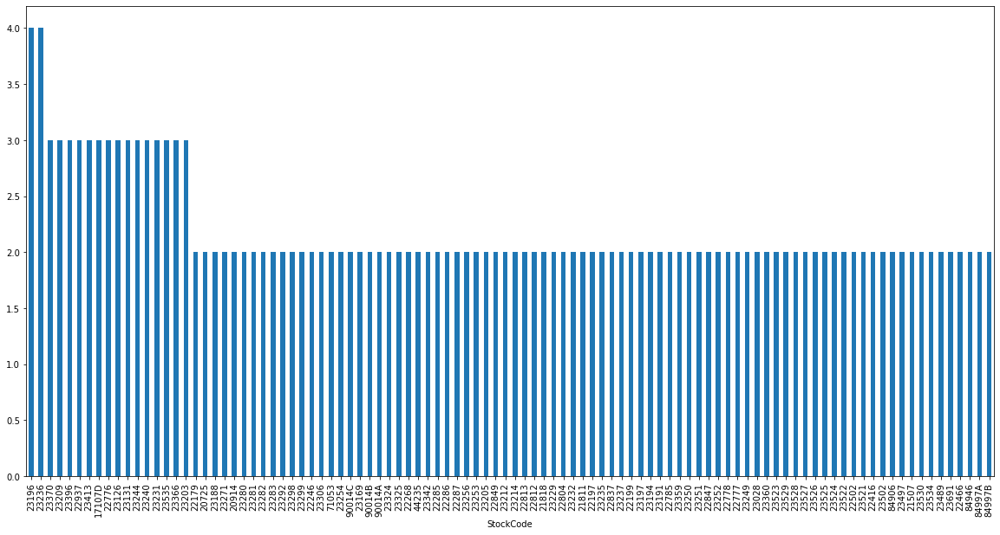

In [23]:
stock_code_df = df[["StockCode","Description"]].groupby("StockCode")["Description"].nunique()
stock_code_df = stock_code_df.sort_values(ascending=False)
plt.figure(figsize=(20,10))
stock_code_df.head(100).plot(kind='bar')

In [24]:
stockcode = df[["StockCode","Description"]].groupby("StockCode")["Description"].unique()
print("Product for stock code 23196: " + stockcode.at["23196"])

print("Product for stock code 23236: " + stockcode.at["23236"])

print("Product for stock code 21243: " + stockcode.at["21243"])

['Product for stock code 23196: RETRO LEAVES MAGNETIC NOTEPAD'
 'Product for stock code 23196: RETO LEAVES MAGNETIC SHOPPING LIST'
 'Product for stock code 23196: LEAVES MAGNETIC  SHOPPING LIST'
 'Product for stock code 23196: VINTAGE LEAF MAGNETIC NOTEPAD']
['Product for stock code 23236: DOILEY STORAGE TIN'
 'Product for stock code 23236: DOILEY BISCUIT TIN'
 'Product for stock code 23236: STORAGE TIN VINTAGE DOILY '
 'Product for stock code 23236: STORAGE TIN VINTAGE DOILEY ']
['Product for stock code 21243: PINK  POLKADOT PLATE '
 'Product for stock code 21243: PINK POLKADOT PLATE ']


- Stockcode seems to denote similar items from different suppliers or with different spellings
- So rather than analysing with product descriptions, it would be advisable with stock codes for some of the analysis

# Study of distribution of sales and customers for each country

In [25]:
df["Individual Revenue"] = df["Quantity"]*df["UnitPrice"]

# Group by geopgraphical distribution
df_revenue = df[["Country","Individual Revenue"]].groupby("Country").sum()
df_customers = df[["Country","CustomerID"]].groupby("Country").nunique()
df_customers.rename(columns ={"CustomerID":"Number of customers"},inplace=True)

In [26]:
df_revenue["% of total revenue"] = df_revenue["Individual Revenue"]*100/np.sum(df_revenue["Individual Revenue"])
df_revenue.reset_index(inplace=True)

df_customers["% of total customers"] = df_customers["Number of customers"]*100/np.sum(df_customers["Number of customers"])
df_customers.reset_index(inplace=True)

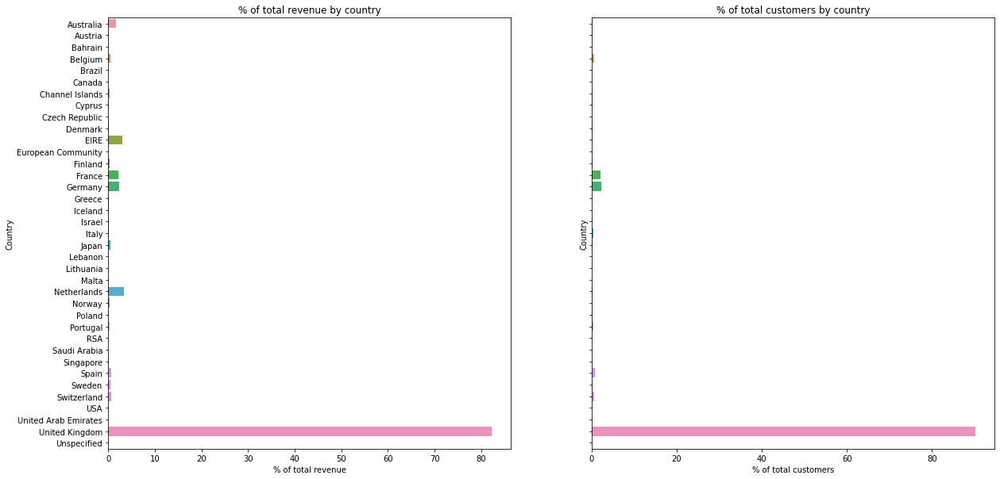

In [27]:
fig, ax = plt.subplots(nrows=1, ncols=2,sharey = True, figsize=(20,10))

ax[0].title.set_text('% of total revenue by country')
g1 = sns.barplot(x= "% of total revenue",y= "Country",
                data=df_revenue,
                ax=ax[0])

ax[1].title.set_text('% of total customers by country')
g2 = sns.barplot(x= "% of total customers",y= "Country",
                data=df_customers,
                ax=ax[1])



## Products which are profitable
- United Kingdom has the highest share of customers and revenue
- Netherlands and ERIE have a lower share of customers but a higher share of revenue compared to Germany which has an equivalent amount of revenue and customers
- This could be due to customer buying behaviour prefering higher priced products. However, it is essential to know these products as they can drive revenue and profitability with a lower customer share


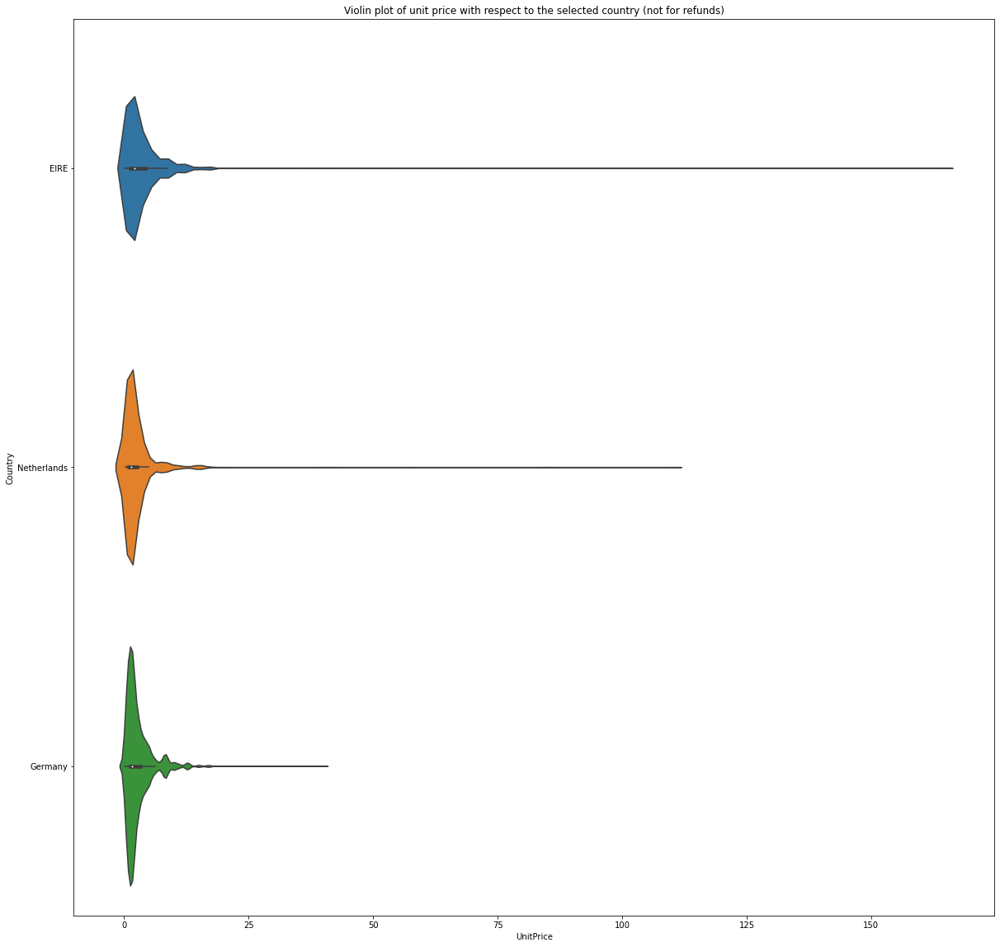

In [28]:
plt.figure(figsize=(20,20))
sns.violinplot(x="UnitPrice", y="Country",
                    data=df[df["Individual Revenue"]>0],order=["EIRE","Netherlands", "Germany"],
                    )
plt.title("Violin plot of unit price with respect to the selected country (not for refunds)")
plt.show()

- Similar preferences in Netherlands, EIRE and Germany for sale of goods. However, occasionally higher priced goods are bought in Netherlands and EIRE
- Let's take this one step further to check if high priced goods are mostly seasonal or not

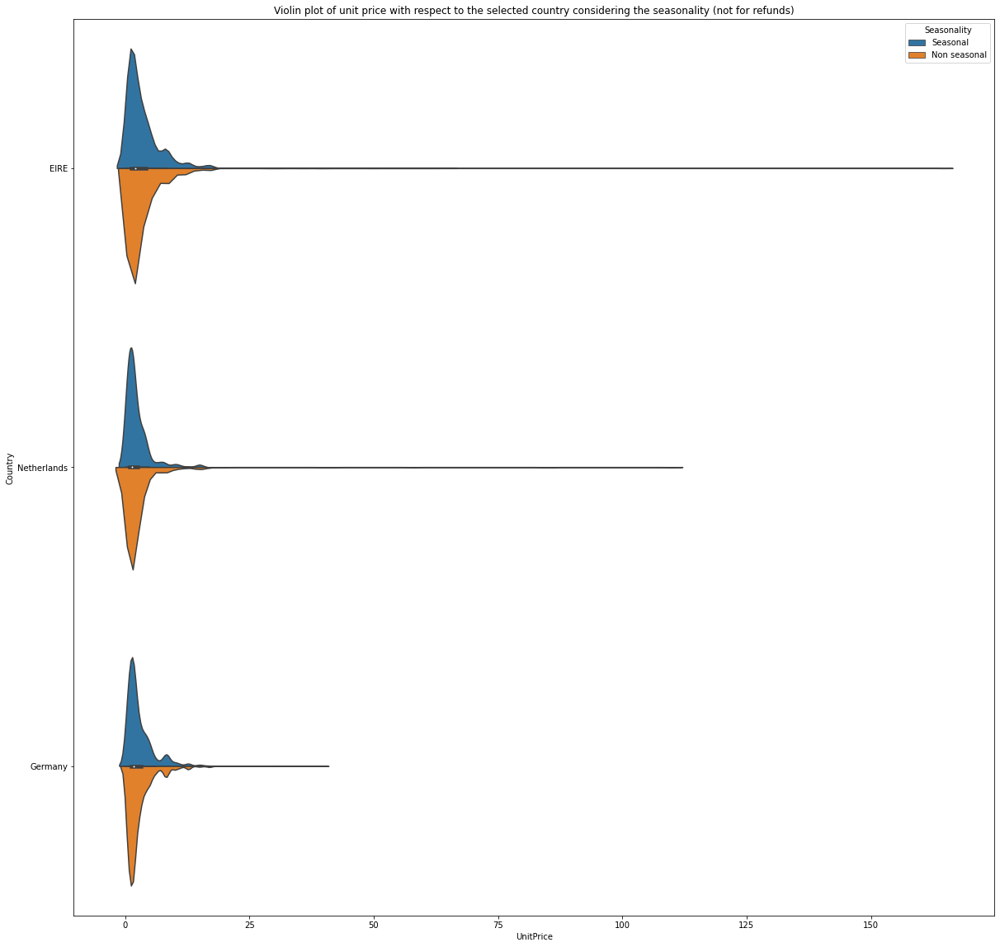

In [29]:
df["Seasonality"] = "Non seasonal"

# November, December are the seasonal months for sales

df.loc[df.InvoiceDate.dt.month.isin([11,12]),"Seasonality"] = "Seasonal"

plt.figure(figsize=(20,20))
sns.violinplot(x="UnitPrice", y="Country",
                    data=df[df["Individual Revenue"]>0],order=["EIRE","Netherlands", "Germany"],
                    hue="Seasonality",split=True)
plt.title("Violin plot of unit price with respect to the selected country considering the seasonality (not for refunds)")
plt.show()

- These products have an almost equitable distribution between seasonal and non-seasonal months
- In order to find these products or stock codes, we can implement K-means to segment these products

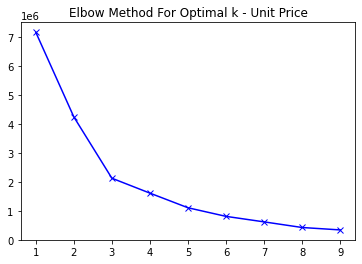

In [30]:
df_price_analysis = df[(df["Individual Revenue"]>0) & (df['StockCode']!="D")]

# Find optimal number of clusters

Sum_of_squared_distances_Price = []
K = range(1,10)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(df_price_analysis["UnitPrice"].values.reshape(-1,1))
    Sum_of_squared_distances_Price.append(km.inertia_)
    
plt.plot(K, Sum_of_squared_distances_Price, 'bx-')
plt.title('Elbow Method For Optimal k - Unit Price')
plt.show()

In [31]:
# Optimal number of clusters
k=6

Cluster_labels = []
kmeans = KMeans(n_clusters=k).fit(df_price_analysis["UnitPrice"].values.reshape(-1,1))
# Order kmeans in sequential order
# https://stackoverflow.com/questions/44888415/how-to-set-k-means-clustering-labels-from-highest-to-lowest-with-python
idx = np.argsort(kmeans.cluster_centers_.sum(axis=1))
lut = np.zeros_like(idx)
lut[idx] = np.arange(k)

df_price_analysis["Labels_UnitPrice"] = lut[kmeans.labels_]

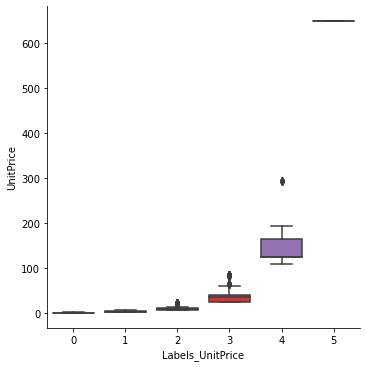

In [32]:
sns.catplot(x="Labels_UnitPrice", y="UnitPrice", kind="box", data=df_price_analysis)
plt.show()

In [33]:
df_high_share = df_price_analysis[(df_price_analysis["Labels_UnitPrice"]>=3) & (df_price_analysis["Country"]!="United Kingdom")]

fig = px.pie(df_high_share, values='Quantity', names="Country",title="Distribution of high priced products sold with respect to different countries (apart from UK)")
fig.update_layout(title_x=0.5)
fig.show()

- Let's find the products which belong to this range which are driving the sales in Netherlands and EIRE

In [34]:
fig = px.treemap(df_high_share[(df_high_share["Country"]=="EIRE") | (df_high_share["Country"]=="Netherlands")], \
                                path=['Description'], values = "Quantity", title="Treemap of the most profitable products according to their quantity for Netherlands and EIRE")
fig.data[0].hovertemplate = '%{label}<br>%{value}'
fig.update_layout(title_x=0.5)
fig.show()

### Top 10 selling products in Netherlands,EIRE,UK and Germany in terms of quantity

In [35]:
df_neth = df[df.Country=="Netherlands"]
df_EIRE = df[df.Country=="EIRE"]
df_Germany = df[df.Country=="Germany"]
df_UK = df[df.Country=="United Kingdom"]

df_neth = df_neth.groupby("Description").sum()
df_EIRE = df_EIRE.groupby("Description").sum()
df_Germany = df_Germany.groupby("Description").sum()
df_UK = df_UK.groupby("Description").sum()

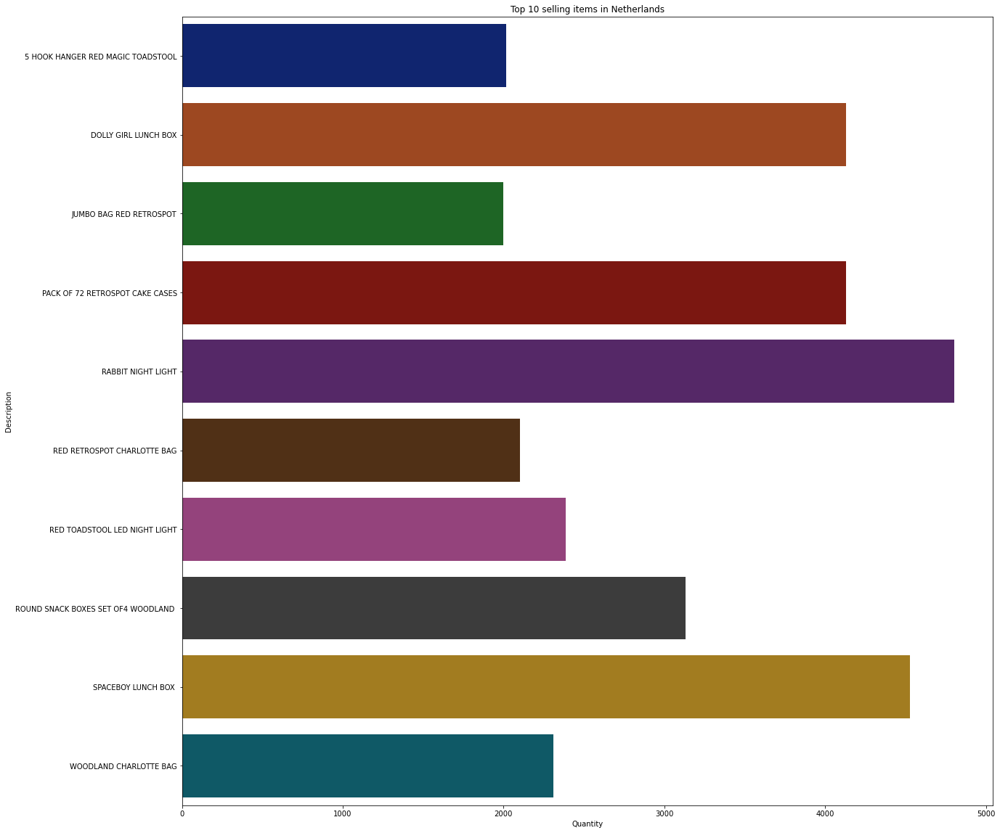

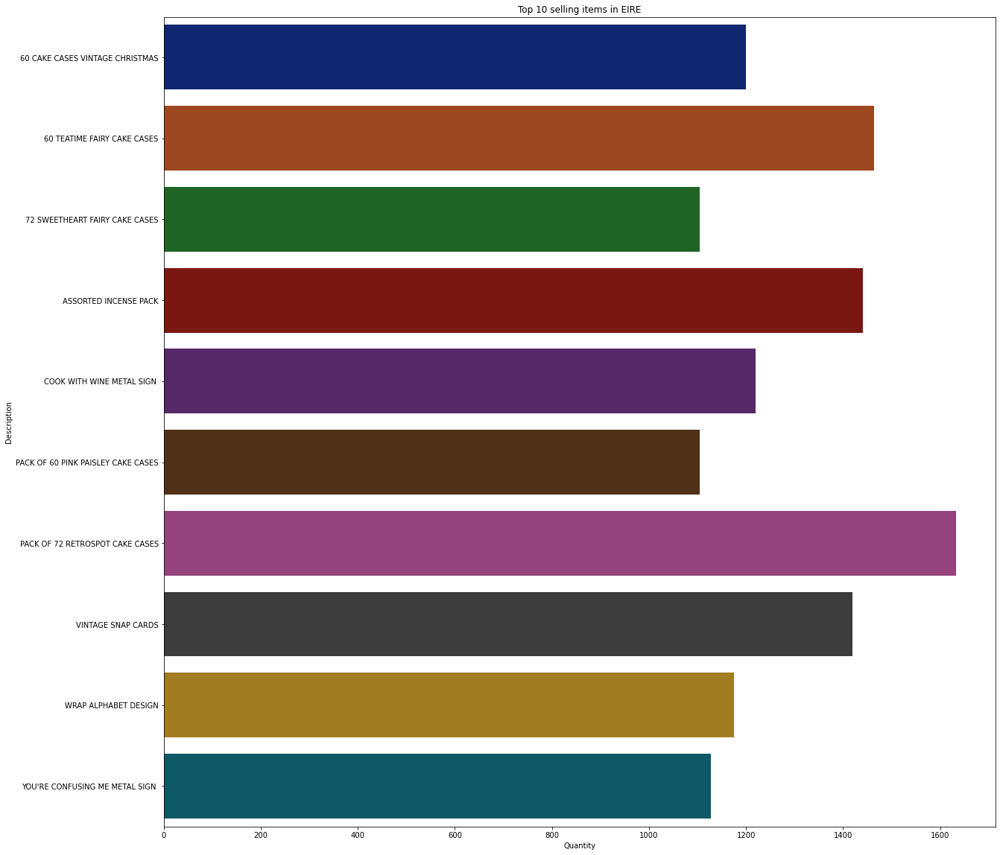

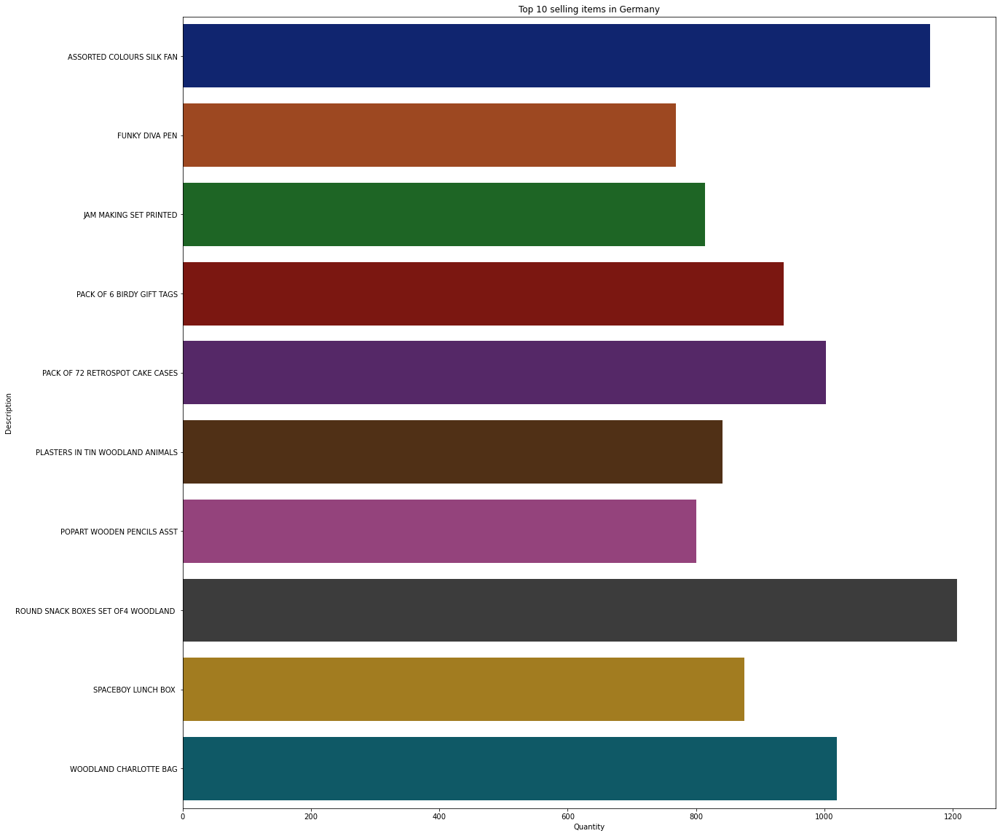

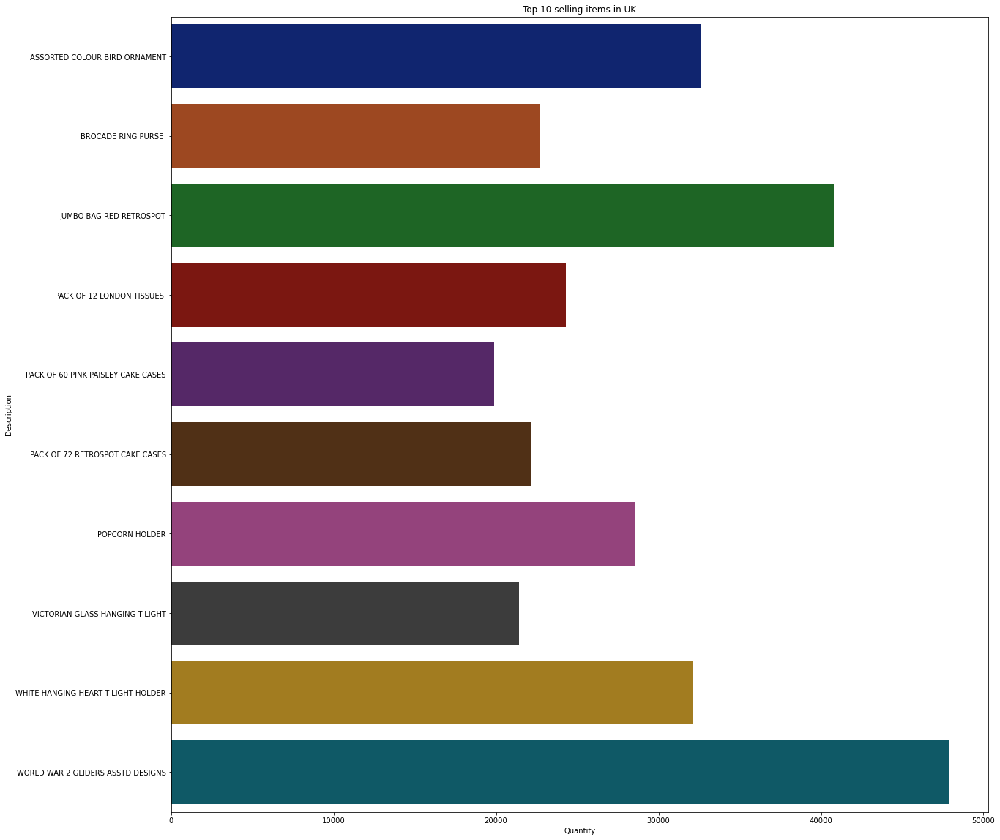

In [36]:
df_neth = df_neth.nlargest(10,columns="Quantity")
df_neth = df_neth.groupby("Description").sum()
df_neth.reset_index(inplace=True)
plt.figure(figsize=(20,20))
plt.title("Top 10 selling items in Netherlands")
sns.barplot(x="Quantity",y="Description",data=df_neth,palette='dark')
plt.show()

df_EIRE = df_EIRE.nlargest(10,columns="Quantity")
df_EIRE = df_EIRE.groupby("Description").sum()
df_EIRE.reset_index(inplace=True)
plt.figure(figsize=(20,20))
plt.title("Top 10 selling items in EIRE")
sns.barplot(x="Quantity",y="Description",data=df_EIRE,palette='dark')
plt.show()

df_Germany = df_Germany.nlargest(10,columns="Quantity")
df_Germany = df_Germany.groupby("Description").sum()
df_Germany.reset_index(inplace=True)
plt.figure(figsize=(20,20))
plt.title("Top 10 selling items in Germany")
sns.barplot(x="Quantity",y="Description",data=df_Germany,palette='dark')
plt.show()

df_UK = df_UK.nlargest(10,columns="Quantity")
df_UK = df_UK.groupby("Description").sum()
df_UK.reset_index(inplace=True)
plt.figure(figsize=(20,20))
plt.title("Top 10 selling items in UK")
sns.barplot(x="Quantity",y="Description",data=df_UK,palette='dark')
plt.show()

## Association rule mining
- Let's find any interesting relation between products for the top 4 revenue generating countries
- Reference - https://pbpython.com/market-basket-analysis.html
- https://www.kaggle.com/datatheque/association-rules-mining-market-basket-analysis
- https://towardsdatascience.com/association-rules-2-aa9a77241654
- https://www.kaggle.com/anmoltripathi/complete-e-commerce-analysis


In [37]:
df_basket = df[df["Individual Revenue"]>0]
basket_Netherlands = df_basket[df_basket['Country']=="Netherlands"].groupby(['InvoiceNo', 'Description'])['Quantity'].sum().unstack().reset_index().fillna(0).set_index('InvoiceNo')
basket_EIRE = df_basket[df_basket['Country']=="EIRE"].groupby(['InvoiceNo', 'Description'])['Quantity'].sum().unstack().reset_index().fillna(0).set_index('InvoiceNo')
basket_Germany = df_basket[df_basket['Country']=="Germany"].groupby(['InvoiceNo', 'Description'])['Quantity'].sum().unstack().reset_index().fillna(0).set_index('InvoiceNo')
basket_UK = df_basket[df_basket['Country']=="United Kingdom"].groupby(['InvoiceNo', 'Description'])['Quantity'].sum().unstack().reset_index().fillna(0).set_index('InvoiceNo')

In [38]:
def encode_units(x):
    if x <= 0:
        return 0
    if x >= 1:
        return 1

basket_sets_Neth = basket_Netherlands.applymap(encode_units)
basket_sets_EIRE = basket_EIRE.applymap(encode_units)
basket_sets_Germany = basket_Germany.applymap(encode_units)
basket_sets_UK = basket_UK.applymap(encode_units)

- Market basket analysis for Netherlands

In [39]:
frequent_itemsets = apriori(basket_sets_Neth, min_support=0.05, use_colnames=True)
rules = association_rules(frequent_itemsets, metric="lift")
rules.sort_values(['lift','support'],ascending=False,inplace=True)
rules.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
650,(FOLDING BUTTERFLY MIRROR RED ),(FOLDING BUTTERFLY MIRROR HOT PINK ),0.053763,0.053763,0.053763,1.0,18.6,0.050873,inf
651,(FOLDING BUTTERFLY MIRROR HOT PINK ),(FOLDING BUTTERFLY MIRROR RED ),0.053763,0.053763,0.053763,1.0,18.6,0.050873,inf
1351,"(CARD DOLLY GIRL , FOOD CONTAINER SET 3 LOVE H...",(10 COLOUR SPACEBOY PEN),0.053763,0.053763,0.053763,1.0,18.6,0.050873,inf
1354,(10 COLOUR SPACEBOY PEN),"(CARD DOLLY GIRL , FOOD CONTAINER SET 3 LOVE H...",0.053763,0.053763,0.053763,1.0,18.6,0.050873,inf
1380,"(CARD DOLLY GIRL , STRAWBERRY LUNCH BOX WITH C...",(10 COLOUR SPACEBOY PEN),0.053763,0.053763,0.053763,1.0,18.6,0.050873,inf
1385,(10 COLOUR SPACEBOY PEN),"(CARD DOLLY GIRL , STRAWBERRY LUNCH BOX WITH C...",0.053763,0.053763,0.053763,1.0,18.6,0.050873,inf
1429,"(PLASTERS IN TIN SPACEBOY, FOOD CONTAINER SET ...",(10 COLOUR SPACEBOY PEN),0.053763,0.053763,0.053763,1.0,18.6,0.050873,inf
1432,(10 COLOUR SPACEBOY PEN),"(PLASTERS IN TIN SPACEBOY, FOOD CONTAINER SET ...",0.053763,0.053763,0.053763,1.0,18.6,0.050873,inf
2497,"(FOLDING BUTTERFLY MIRROR RED , CARD DOLLY GI...",(FOLDING BUTTERFLY MIRROR HOT PINK ),0.053763,0.053763,0.053763,1.0,18.6,0.050873,inf
2498,"(FOLDING BUTTERFLY MIRROR HOT PINK , CARD DOLL...",(FOLDING BUTTERFLY MIRROR RED ),0.053763,0.053763,0.053763,1.0,18.6,0.050873,inf


- Apart from an indicator of FOLDING BUTTERFLY MIRROR being bought in bulk,probably from a large bulk supplier. 10 COLOUR SPACEBOY PEN seems to be commonly associated with other supplies as indicated by it's high lift and consequnce when it is an ancedent

- Market basket analysis for EIRE

In [40]:
frequent_itemsets = apriori(basket_sets_EIRE, min_support=0.05, use_colnames=True)
rules = association_rules(frequent_itemsets, metric="lift")
rules.sort_values(['lift','support'],ascending=False,inplace=True)
rules.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
1055,"(REGENCY CAKESTAND 3 TIER, REGENCY TEA PLATE P...","(REGENCY TEA PLATE GREEN , PINK REGENCY TEACUP...",0.054688,0.054688,0.050781,0.928571,16.979592,0.047791,13.234375
1058,"(REGENCY TEA PLATE GREEN , PINK REGENCY TEACUP...","(REGENCY CAKESTAND 3 TIER, REGENCY TEA PLATE P...",0.054688,0.054688,0.050781,0.928571,16.979592,0.047791,13.234375
1022,"(REGENCY CAKESTAND 3 TIER, GREEN REGENCY TEACU...","(REGENCY TEA PLATE GREEN , ROSES REGENCY TEACU...",0.050781,0.062500,0.050781,1.000000,16.000000,0.047607,inf
1031,"(REGENCY TEA PLATE GREEN , ROSES REGENCY TEACU...","(REGENCY CAKESTAND 3 TIER, GREEN REGENCY TEACU...",0.062500,0.050781,0.050781,0.812500,16.000000,0.047607,5.062500
1052,"(REGENCY CAKESTAND 3 TIER, REGENCY TEA PLATE P...","(REGENCY TEA PLATE GREEN , ROSES REGENCY TEACU...",0.050781,0.062500,0.050781,1.000000,16.000000,0.047607,inf
1061,"(REGENCY TEA PLATE GREEN , ROSES REGENCY TEACU...","(REGENCY CAKESTAND 3 TIER, REGENCY TEA PLATE P...",0.062500,0.050781,0.050781,0.812500,16.000000,0.047607,5.062500
1082,"(REGENCY CAKESTAND 3 TIER, REGENCY TEA PLATE R...","(REGENCY TEA PLATE GREEN , ROSES REGENCY TEACU...",0.050781,0.062500,0.050781,1.000000,16.000000,0.047607,inf
1091,"(REGENCY TEA PLATE GREEN , ROSES REGENCY TEACU...","(REGENCY CAKESTAND 3 TIER, REGENCY TEA PLATE R...",0.062500,0.050781,0.050781,0.812500,16.000000,0.047607,5.062500
704,"(REGENCY CAKESTAND 3 TIER, REGENCY TEA PLATE P...","(REGENCY TEA PLATE GREEN , PINK REGENCY TEACUP...",0.062500,0.054688,0.050781,0.812500,14.857143,0.047363,5.041667
709,"(REGENCY TEA PLATE GREEN , PINK REGENCY TEACUP...","(REGENCY CAKESTAND 3 TIER, REGENCY TEA PLATE P...",0.054688,0.062500,0.050781,0.928571,14.857143,0.047363,13.125000


- Market basket analysis for Germany

In [41]:
frequent_itemsets = apriori(basket_sets_Germany, min_support=0.05, use_colnames=True)
rules = association_rules(frequent_itemsets, metric="lift")
rules.sort_values(['lift','support'],ascending=False,inplace=True)
rules.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
10,(WOODLAND CHARLOTTE BAG),(RED RETROSPOT CHARLOTTE BAG),0.130926,0.072235,0.060948,0.465517,6.444504,0.051491,1.735819
11,(RED RETROSPOT CHARLOTTE BAG),(WOODLAND CHARLOTTE BAG),0.072235,0.130926,0.060948,0.843750,6.444504,0.051491,5.562077
0,(PLASTERS IN TIN CIRCUS PARADE ),(PLASTERS IN TIN WOODLAND ANIMALS),0.119639,0.142212,0.069977,0.584906,4.112908,0.052963,2.066489
1,(PLASTERS IN TIN WOODLAND ANIMALS),(PLASTERS IN TIN CIRCUS PARADE ),0.142212,0.119639,0.069977,0.492063,4.112908,0.052963,1.733211
6,(PLASTERS IN TIN SPACEBOY),(PLASTERS IN TIN WOODLAND ANIMALS),0.110609,0.142212,0.063205,0.571429,4.018141,0.047475,2.001505
7,(PLASTERS IN TIN WOODLAND ANIMALS),(PLASTERS IN TIN SPACEBOY),0.142212,0.110609,0.063205,0.444444,4.018141,0.047475,1.600903
12,(ROUND SNACK BOXES SET OF4 WOODLAND ),(ROUND SNACK BOXES SET OF 4 FRUITS ),0.252822,0.162528,0.135440,0.535714,3.296131,0.094350,1.803785
13,(ROUND SNACK BOXES SET OF 4 FRUITS ),(ROUND SNACK BOXES SET OF4 WOODLAND ),0.162528,0.252822,0.135440,0.833333,3.296131,0.094350,4.483070
14,(ROUND SNACK BOXES SET OF4 WOODLAND ),(SPACEBOY LUNCH BOX ),0.252822,0.106095,0.072235,0.285714,2.693009,0.045412,1.251467
15,(SPACEBOY LUNCH BOX ),(ROUND SNACK BOXES SET OF4 WOODLAND ),0.106095,0.252822,0.072235,0.680851,2.693009,0.045412,2.341159


- Market basket analysis for UK

In [42]:
frequent_itemsets = apriori(basket_sets_UK, min_support=0.02, use_colnames=True)
rules = association_rules(frequent_itemsets, metric="lift")
rules.sort_values(['lift','support'],ascending=False,inplace=True)
rules.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
72,"(PINK REGENCY TEACUP AND SAUCER, ROSES REGENCY...",(GREEN REGENCY TEACUP AND SAUCER),0.023102,0.036914,0.020568,0.890339,24.119179,0.019715,8.782426
73,(GREEN REGENCY TEACUP AND SAUCER),"(PINK REGENCY TEACUP AND SAUCER, ROSES REGENCY...",0.036914,0.023102,0.020568,0.557190,24.119179,0.019715,2.206132
71,"(GREEN REGENCY TEACUP AND SAUCER, ROSES REGENC...",(PINK REGENCY TEACUP AND SAUCER),0.028711,0.029736,0.020568,0.716387,24.091222,0.019714,3.421078
74,(PINK REGENCY TEACUP AND SAUCER),"(GREEN REGENCY TEACUP AND SAUCER, ROSES REGENC...",0.029736,0.028711,0.020568,0.691684,24.091222,0.019714,3.150299
4,(GREEN REGENCY TEACUP AND SAUCER),(PINK REGENCY TEACUP AND SAUCER),0.036914,0.029736,0.024368,0.660131,22.199406,0.023270,2.854814
5,(PINK REGENCY TEACUP AND SAUCER),(GREEN REGENCY TEACUP AND SAUCER),0.029736,0.036914,0.024368,0.819473,22.199406,0.023270,5.334846
70,"(GREEN REGENCY TEACUP AND SAUCER, PINK REGENCY...",(ROSES REGENCY TEACUP AND SAUCER ),0.024368,0.040895,0.020568,0.844059,20.639618,0.019572,6.150450
75,(ROSES REGENCY TEACUP AND SAUCER ),"(GREEN REGENCY TEACUP AND SAUCER, PINK REGENCY...",0.040895,0.024368,0.020568,0.502950,20.639618,0.019572,1.962844
6,(GREEN REGENCY TEACUP AND SAUCER),(ROSES REGENCY TEACUP AND SAUCER ),0.036914,0.040895,0.028711,0.777778,19.018846,0.027201,4.315972
7,(ROSES REGENCY TEACUP AND SAUCER ),(GREEN REGENCY TEACUP AND SAUCER),0.040895,0.036914,0.028711,0.702065,19.018846,0.027201,3.232536


-  From the data from Germany, UK and ERIE, indication of bulk purchases of similar type of goods seems to be happening.
- This indicates that they are probably being bought by a wholesale retailer

# Analyse behaviour of revenue with time with a cohort analysis
- As the customer list contains some ambiguities with respect to refunds, we can do cohort analysis for revenue as the negative sales values takes effect with addition
- As marketing varies from different geographical conditions, let's perform cohort analysis for UK alone (Top revenue generation)
- http://www.gregreda.com/2015/08/23/cohort-analysis-with-python/

In [43]:
# change the invoice_date format from string to timestep
df['OrderPeriod'] = df.InvoiceDate.apply(lambda x: x.strftime('%Y-%m'))
df = df[df.Country=="United Kingdom"]

df.set_index('CustomerID', inplace=True)
df['CohortGroup'] = df.groupby(['CustomerID'])['InvoiceDate'].min().apply(lambda x: x.strftime('%Y-%m'))
df.reset_index(inplace=True)
df.drop(columns=["Country","UnitPrice"],inplace=True)

In [44]:
cohorts = df.groupby(['CohortGroup', 'OrderPeriod']).agg({'CustomerID': pd.Series.nunique,"Individual Revenue":'sum'})
cohorts.rename(columns={'CustomerID': 'Total Users', "Individual Revenue":'Total revenue'}, inplace=True)

In [45]:
def cohort_period(df):
    """
    Number of periods after the first purchase for each cohort group
    
    """
    df['CohortPeriod'] = np.arange(len(df)) + 1
    return df

cohorts = cohorts.groupby(level=0).apply(cohort_period)
cohorts.head(20)

Total Users  Total revenue  CohortPeriod
CohortGroup OrderPeriod                                          
2010-12     2010-12            870.0      481399.31             1
            2011-01            320.0      195650.07             2
            2011-02            290.0      184724.17             3
            2011-03            328.0      233010.85             4
            2011-04            308.0      174968.15             5
            2011-05            345.0      261606.45             6
            2011-06            325.0      249236.09             7
            2011-07            301.0      234048.72             8
            2011-08            304.0      245110.40             9
            2011-09            345.0      376297.01            10
            2011-10            319.0      335144.87            11
            2011-11            428.0      411547.57            12
            2011-12            237.0      152990.26            13
2011-01     2011-01            362.0      155017.35             1
            2011-02             83.0       35561.13             2
            2011-03            101.0       39484.26             3
            2011-04             89.0       35854.57             4
            2011-05            122.0       60050.06             5
            2011-06            106.0       50133.70             6
            2011-07             95.0       58261.56             7

In [46]:
# reindex the DataFrame
cohorts.reset_index(inplace=True)
cohorts.set_index(['CohortGroup', 'CohortPeriod'], inplace=True)

# create individual holding the total revenue of each cohort group
cohort_revenue = cohorts['Total revenue'].groupby(level=0).first()
print(cohort_revenue.head())

CohortGroup
2010-12    481399.31
2011-01    155017.35
2011-02    128964.86
2011-03    160517.56
2011-04    107953.03
Name: Total revenue, dtype: float64


In [47]:
cohorts.drop(columns = ["OrderPeriod"],inplace=True)
cohorts.reset_index(inplace=True)

# For total revenue
cohorts_customer_revenue = cohorts.pivot(index="CohortPeriod",columns="CohortGroup",values="Total revenue")
print(cohorts_customer_revenue.head(10))

CohortGroup     2010-12    2011-01    2011-02    2011-03    2011-04   2011-05  \
CohortPeriod                                                                    
1             481399.31  155017.35  128964.86  160517.56  107953.03  91642.02   
2             195650.07   35561.13   22938.06   25399.50   25801.51  15681.73   
3             184724.17   39484.26   29293.46   51926.92   22914.99  15470.20   
4             233010.85   35854.57   42004.07   35534.26   22656.15  16292.44   
5             174968.15   60050.06   34178.01   42980.51   24295.21  24522.68   
6             261606.45   50133.70   27666.68   33261.48   24325.52  25164.77   
7             249236.09   58261.56   40555.89   52494.62   26671.94  26048.77   
8             234048.72   42565.97   49626.61   51854.29   30634.22   8363.25   
9             245110.40   63086.86   47246.05   61058.14    5380.48       NaN   
10            376297.01   72377.42   53279.42   10944.91        NaN       NaN   

CohortGroup     2011-06   2

In [48]:
# Revenue retention
CustomerRevenueRetentionAnalysis = cohorts_customer_revenue.div(cohort_revenue)
print(CustomerRevenueRetentionAnalysis)

CohortGroup    2010-12   2011-01   2011-02   2011-03   2011-04   2011-05  \
CohortPeriod                                                               
1             1.000000  1.000000  1.000000  1.000000  1.000000  1.000000   
2             0.406420  0.229401  0.177863  0.158235  0.239007  0.171119   
3             0.383723  0.254709  0.227143  0.323497  0.212268  0.168811   
4             0.484028  0.231294  0.325702  0.221373  0.209870  0.177784   
5             0.363457  0.387376  0.265018  0.267762  0.225054  0.267592   
6             0.543429  0.323407  0.214529  0.207214  0.225334  0.274599   
7             0.517733  0.375839  0.314472  0.327034  0.247070  0.284245   
8             0.486184  0.274588  0.384807  0.323044  0.283774  0.091260   
9             0.509162  0.406966  0.366348  0.380383  0.049841       NaN   
10            0.781673  0.466899  0.413131  0.068185       NaN       NaN   
11            0.696189  0.649232  0.069149       NaN       NaN       NaN   
12          

<AxesSubplot:title={'center':'Revenue Retention'}, xlabel='CohortPeriod', ylabel='CohortGroup'>

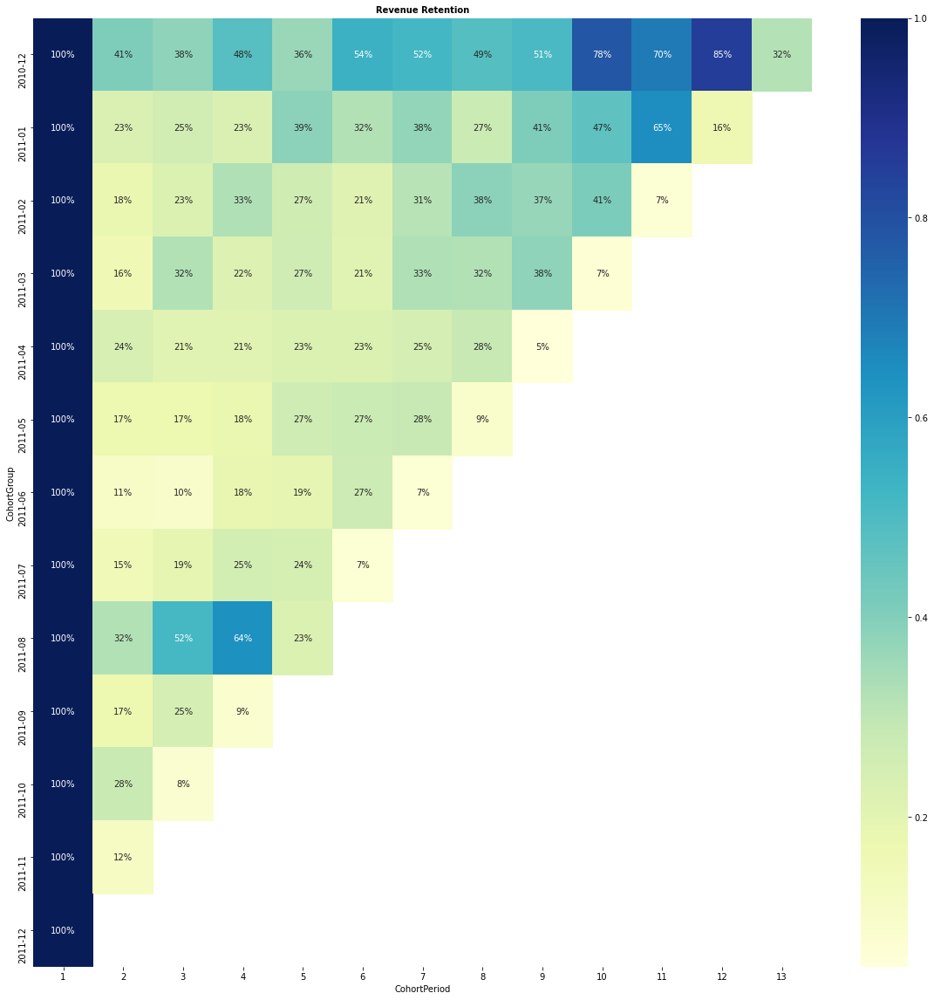

In [49]:
plt.figure(figsize=(20,20))
plt.title('Revenue Retention',fontsize=10, weight = 'bold', color="black")
sns.heatmap(CustomerRevenueRetentionAnalysis.T, mask=CustomerRevenueRetentionAnalysis.T.isnull(), annot=True,cmap="YlGnBu", fmt='.0%')

- 2010-12, 2011-01 and 2011-08 period has the highest revenue retention among all the periods. Maybe during these periods, the company had a effective marketing strategy. 


# Derivation of marketing strategies

## Customer segmentation will be achieved with an RFM matrix. It has three indicators 
```
1. Recency - When the customer last bought from the store. Calculated with the difference between the last date of purchase ever to date of purchase
2. Frequency - No of times customer has bought from the store
3. Monetary - Total purchase from the customer
```

- Here, let's analyse only based on purchases not based on returns or cancellations
- For UK alone, for targeted marketing

In [50]:
df = df[~df['InvoiceNo'].str.contains('C', na=False)]
df = df[df["Quantity"]>0]

# Non consideration of discounts
df = df[df["StockCode"]!='D']

In [51]:
# Latest purchase
max_date = df["InvoiceDate"].max()

rfm_df = df.groupby("CustomerID").agg({"InvoiceDate":lambda date: (max_date - date.max()).days,
                                      "InvoiceNo": 'count',
                                      "Individual Revenue":'sum'})

rfm_df.rename(columns={"InvoiceDate":"Recency","InvoiceNo":"Frequency","Individual Revenue":"Monetary"},inplace=True)
print(rfm_df)

            Recency  Frequency  Monetary
CustomerID                              
12346.0         325          1  77183.60
12747.0           1        103   4196.01
12748.0           0       4397  31650.78
12749.0           3        198   4040.88
12820.0           2         59    942.34
...             ...        ...       ...
18280.0         277         10    180.60
18281.0         180          7     80.82
18282.0           7         12    178.05
18283.0           3        719   2039.58
18287.0          42         70   1837.28

[3916 rows x 3 columns]


- One way of customer segmentation is through dividing it with quantiles.
- Another way is use unsupervised learning to divide into segments.

### Customer segmentation by behaviour

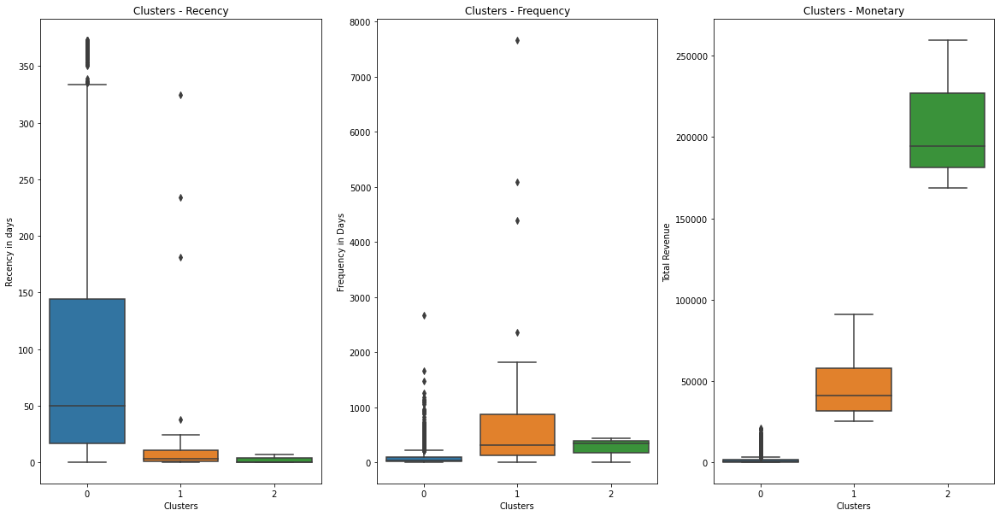

In [52]:
km = KMeans(n_clusters=3)
cluster_labels = km.fit_predict(rfm_df)

# https://stackoverflow.com/questions/44888415/how-to-set-k-means-clustering-labels-from-highest-to-lowest-with-python
idx = np.argsort(km.cluster_centers_.sum(axis=1))
lut = np.zeros_like(idx)
lut[idx] = np.arange(3)

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20,10))
sns.boxplot(lut[km.labels_],rfm_df["Recency"].tolist(),ax=ax[0])
ax[0].set(xlabel="Clusters", ylabel = "Recency in days")
ax[0].title.set_text('Clusters - Recency')
sns.boxplot(lut[km.labels_],rfm_df["Frequency"].tolist(),ax=ax[1])
ax[1].set(xlabel="Clusters", ylabel = "Frequency in Days")
ax[1].title.set_text('Clusters - Frequency')
sns.boxplot(lut[km.labels_],rfm_df["Monetary"].tolist(),ax=ax[2])
ax[2].set(xlabel="Clusters", ylabel = "Total Revenue")
ax[2].title.set_text('Clusters - Monetary')

- Some interesting observations such as the clear segmentation on revenue
1. Many high paying customers have not bought frequently and recently. 
2. Company haven't gained substantial income from frequent customers
3. Let's break into segments

In [53]:
rfm_df["Cluster labels"] = lut[km.labels_]

In [54]:
typec1 = 'Customers who may or may have not bought recently,do not buy frequently enough and contribute the least' # 0
typec3 = 'Customers who have not bought recently, do not buy frequently enough but contribute the most'        # 2
typec2 = 'Customers who may or may have not bought recently, may or may not buy frequently enough but contribute sufficiently'# 1

def func(x):
    if x == 0:
        return typec1
    elif x == 2:
        return typec3
    elif x == 1:
        return typec2
    else:
        return 'N/A'

rfm_df["Customer segments"] = rfm_df["Cluster labels"].apply(func)
print(rfm_df)

            Recency  Frequency  Monetary  Cluster labels  \
CustomerID                                                 
12346.0         325          1  77183.60               1   
12747.0           1        103   4196.01               0   
12748.0           0       4397  31650.78               1   
12749.0           3        198   4040.88               0   
12820.0           2         59    942.34               0   
...             ...        ...       ...             ...   
18280.0         277         10    180.60               0   
18281.0         180          7     80.82               0   
18282.0           7         12    178.05               0   
18283.0           3        719   2039.58               0   
18287.0          42         70   1837.28               0   

                                            Customer segments  
CustomerID                                                     
12346.0     Customers who may or may have not bought recen...  
12747.0     Customers who m

In [55]:
plt.figure(figsize=(10,10))

fig = px.pie(rfm_df, names='Customer segments',title="Distribution of customer buying behaviour")
fig.data[0].hovertemplate = '%{label}'
fig.update_layout(showlegend=False, title_x=0.5)
fig.show()

plt.figure(figsize=(10,10))

fig = px.pie(rfm_df, names='Customer segments',title="Distribution of customer buying behaviour with revenue",values="Monetary")
fig.data[0].hovertemplate = '%{label}'
fig.update_layout(showlegend=False, title_x=0.5)
fig.show()

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

- Major share of customers do not buy frequently and contribute individually a lower revenue to the company
- However, these customers also account for the bulk of the monetary value of the company.
- Hence, inventory managment here is very critical


### Possible marketing strategies
- In order for effective targeting, selective strategy specific to the use case must be undertaken
- Hence selective clustering for frequency, monetary and recency must be undertaken

### Finding the optimal number of clusters

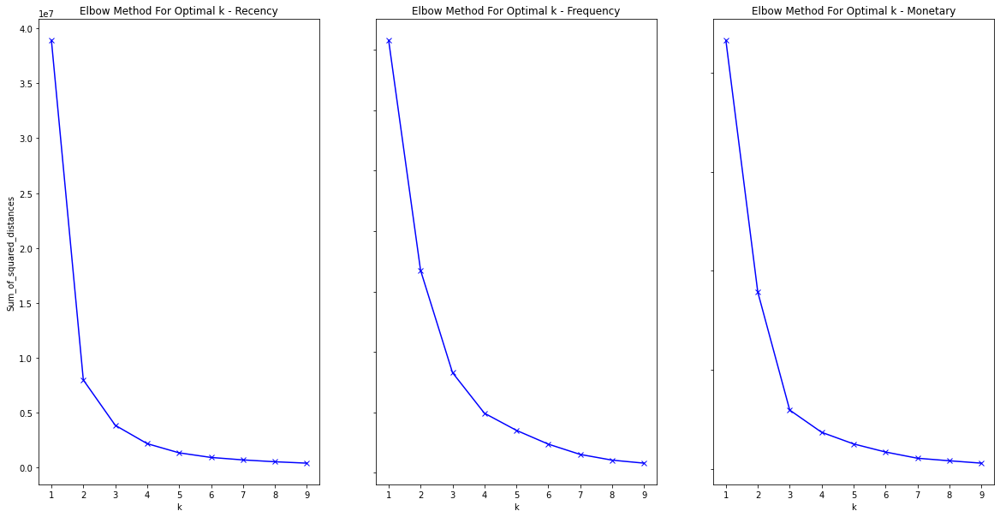

In [56]:
# Find optimal number of clusters

Sum_of_squared_distances_rec = []
K = range(1,10)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(rfm_df["Recency"].values.reshape(-1,1))
    Sum_of_squared_distances_rec.append(km.inertia_)
    
Sum_of_squared_distances_freq = []
K = range(1,10)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(rfm_df["Frequency"].values.reshape(-1,1))
    Sum_of_squared_distances_freq.append(km.inertia_)
    
    
Sum_of_squared_distances_mon = []
K = range(1,10)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(rfm_df["Monetary"].values.reshape(-1,1))
    Sum_of_squared_distances_mon.append(km.inertia_)
 
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20,10))
ax[0].plot(K, Sum_of_squared_distances_rec, 'bx-')
ax[0].set_title('Elbow Method For Optimal k - Recency')


ax[1].plot(K, Sum_of_squared_distances_freq, 'bx-')
ax[1].set_title('Elbow Method For Optimal k - Frequency')


ax[2].plot(K, Sum_of_squared_distances_mon, 'bx-')
ax[2].set_title('Elbow Method For Optimal k - Monetary')

for a in ax.flat:
    a.set(xlabel='k', ylabel='Sum_of_squared_distances')
    
# Hide x labels and tick labels for top plots and y ticks for right plots.
for a in ax.flat:
    a.label_outer()
    
plt.show()

- 5 clusters seem to be an acceptable number of clusters for frequncy, Recency and Monetary values

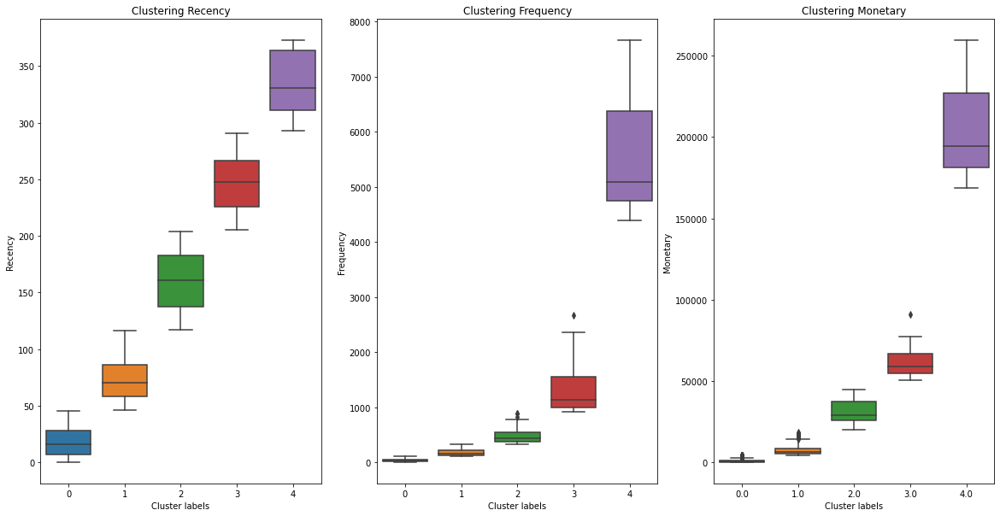

In [57]:
k=5

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20,10))
labels = ["Recency","Frequency","Monetary"]

Cluster_labels = []

for i in range(len(labels)):
    kmeans = KMeans(n_clusters=k).fit(rfm_df[labels[i]].values.reshape(-1,1))   
    idx = np.argsort(kmeans.cluster_centers_.sum(axis=1))
    lut = np.zeros_like(idx)
    lut[idx] = np.arange(k)
    

    dict = {
    labels[i]: rfm_df[labels[i]].tolist(),
     "Cluster_labels": list(lut[kmeans.labels_])
     }
    param_df=pd.DataFrame.from_dict(dict,orient='index').transpose()
    sns.boxplot(x="Cluster_labels", y=labels[i], data=param_df,ax=ax[i])
    
    ax[i].set(xlabel="Cluster labels", ylabel = labels[i])
    ax[i].title.set_text("Clustering " + labels[i])
    
        
    rfm_df["Cluster labels - " + str(labels[i])] = list(lut[kmeans.labels_])

    
    
plt.show()


In [58]:
# https://guillaume-martin.github.io/rfm-segmentation-with-python.html

segt_map = {
    r'[0-1][0-1]': 'First timers - SMS ads',
    r'[0-1][2-3]': 'At risk - Discounts',
    r'[0-1]4': 'Immediate targeting - Promotions',
    r'2[0-1]': 'About to lose - Feedback form',
    r'[2-3][3-4]': 'Regular customers - Loyalty cards',
    r'30': 'Promising - Instant vouchers',
    r'40': 'New customers - 50 % discounts on certain items',
    r'[3-4][1-2]': 'Potential regular customers - Loyalty cards',
    r'4[3-4]': 'Best customers - Loyalty cards',
    r'22': 'Need attention - Discounts'
}  # For example if customers hasn't bought for a long time and has tried the shop only once, an SMS ad might     
   # rekindle interest


rfm_df["RFM class"] = rfm_df['Cluster labels - Recency'].apply(str)+ rfm_df['Cluster labels - Frequency'].apply(str) + \
rfm_df['Cluster labels - Monetary'].apply(str)

# Marketing strategy based on recency and frequnecy of shopping alone
rfm_df['Marketing strategy'] = rfm_df['Cluster labels - Recency'].apply(str)+ rfm_df['Cluster labels - Frequency'].apply(str)
rfm_df['Marketing strategy'] = rfm_df['Marketing strategy'].replace(segt_map, regex=True)
rfm_df.head(5)

,Recency,Frequency,Monetary,Cluster labels,Customer segments,Cluster labels - Recency,Cluster labels - Frequency,Cluster labels - Monetary,RFM class,Marketing strategy
CustomerID,,,,,,,,,,
12346.0,325,1,77183.60,1,Customers who may or may have not bought recen...,4,0,3,403,New customers - 50 % discounts on certain items
12747.0,1,103,4196.01,0,Customers who may or may have not bought recen...,0,0,0,000,First timers - SMS ads
12748.0,0,4397,31650.78,1,Customers who may or may have not bought recen...,0,4,2,042,Immediate targeting - Promotions
12749.0,3,198,4040.88,0,Customers who may or may have not bought recen...,0,1,0,010,First timers - SMS ads
12820.0,2,59,942.34,0,Customers who may or may have not bought recen...,0,0,0,000,First timers - SMS ads


In [59]:
fig = px.treemap(rfm_df, path=['Marketing strategy'],title ="Treemap of marketing strategies")
fig.data[0].hovertemplate = '%{label}'
fig.update_layout(title_x=0.5)
fig.show()

# Inventory management

- As discussed earlier, major share of customers do not buy frequently and contribute individually a lower revenue to the company. Also, these customers also account for the bulk of the monetary value of the company.
- Hence, inventory management is very critical
- One strategy is to find products which sell quickly
- Another involves arranging finding products which sell mostly at particular periods of time (example holidays or particular months)
- Additionally analysis will be done for UK alone 


## Inventory management as per purchase rate

In [60]:
# Latest purchase
max_date = df["InvoiceDate"].max()

# Analysis done with stock code as similar stock code denotes same type of item from multiple suppliers. Hence, there 
# is a flexibility for the supplier to buy the same product from multiple suppliers
IM_df = df.groupby("StockCode").agg({"InvoiceDate":lambda date: (max_date - date.max()).days,
                                      "Quantity": 'sum',
                                      "Individual Revenue":'sum'})

IM_df.rename(columns={"InvoiceDate":"Recency","Quantity":"Frequency","Individual Revenue":"Monetary"},inplace=True)


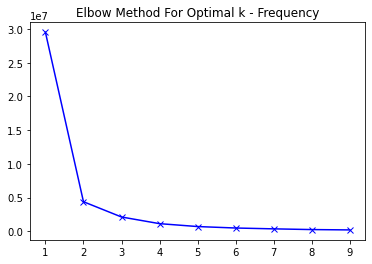

In [61]:
# Find optimal number of clusters

Sum_of_squared_distances_freq = []
K = range(1,10)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(IM_df["Recency"].values.reshape(-1,1))
    Sum_of_squared_distances_freq.append(km.inertia_)
    
plt.plot(K, Sum_of_squared_distances_freq, 'bx-')
plt.title('Elbow Method For Optimal k - Frequency')
plt.show()

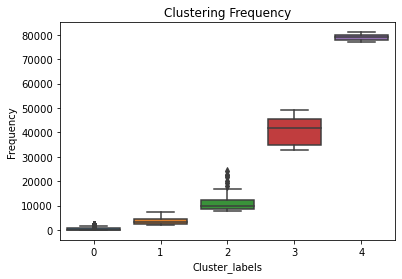

In [62]:
k=5

Cluster_labels = []
kmeans = KMeans(n_clusters=k).fit(IM_df["Frequency"].values.reshape(-1,1))
idx = np.argsort(kmeans.cluster_centers_.sum(axis=1))
lut = np.zeros_like(idx)
lut[idx] = np.arange(k)
    
dict = {
"Frequency": IM_df["Frequency"].tolist(),
"Cluster_labels": list(lut[kmeans.labels_])
}
param_df=pd.DataFrame.from_dict(dict,orient='index').transpose()
sns.boxplot(x="Cluster_labels", y="Frequency", data=param_df)

plt.title("Clustering " + "Frequency")
    
IM_df["Cluster labels - " + "Frequency"] = list(lut[kmeans.labels_])    
    
plt.show()


In [63]:
IM_df.loc[IM_df["Cluster labels - Frequency"]==0,"Cluster labels - Frequency"]= "Low purchase rate"
IM_df.loc[IM_df["Cluster labels - Frequency"]==1,"Cluster labels - Frequency"]= "Lower mid purchase rate"
IM_df.loc[IM_df["Cluster labels - Frequency"]==2,"Cluster labels - Frequency"]= "Mid purchase rate"
IM_df.loc[IM_df["Cluster labels - Frequency"]==3,"Cluster labels - Frequency"]= "Higher mid purchase rate"
IM_df.loc[IM_df["Cluster labels - Frequency"]==4,"Cluster labels - Frequency"]= "Higher purchase rate"

In [64]:
fig = px.treemap(IM_df, path=['Cluster labels - Frequency'],values="Monetary", title="Treemap of product purchase rate with revenue")
fig.data[0].hovertemplate = '%{label}<br>%{value}'
fig.update_layout(title_x=0.5)
fig.show()

- Products which are brought infrequently contribute to a larger revenue

In [65]:
print(IM_df[IM_df["Cluster labels - Frequency"]=="Higher purchase rate"].head(10))

           Recency  Frequency   Monetary Cluster labels - Frequency
StockCode                                                          
23166            2      76919   80291.44       Higher purchase rate
23843            0      80995  168469.60       Higher purchase rate


- These stocks needs to be replenished at a faster rate as indicated also by their lower recency

## Inventory management as per seasonality

In [66]:
df["Seasonality"] = "Non seasonal"

# November, December are the seasonal months for sales
# https://www.statista.com/topics/6297/holiday-retail-in-the-uk/#:~:text=Typically%2C%20during%20the%20months%20of,seen%20even%20more%20elevated%20numbers.

df.loc[df.InvoiceDate.dt.month.isin([11,12]),"Seasonality"] = "Seasonal"

fig = px.pie(df, values='Individual Revenue', names="Seasonality",title="Distribution of revenue according to seasonal and non seasonal sales")
fig.update_layout(title_x=0.5)
fig.show()

- Nearly 27 % of the sales come from the holiday months alone. Hence significant attention has to be paid to the products that are sold during this period in order to ensure that these stocks don't run out

In [67]:
Seasonal_df = df[df.Seasonality== "Seasonal"]
Non_Seasonal_df = df[df.Seasonality== "Non seasonal"]

- Groupby stock code as single stock code refers to similar products from different suppliers
- Reference: https://www.kaggle.com/anmoltripathi/complete-e-commerce-analysis

In [68]:
Seasonal_df = Seasonal_df[["Quantity","StockCode"]].groupby("StockCode").sum()
Non_Seasonal_df  = Non_Seasonal_df[["Quantity","StockCode"]].groupby("StockCode").sum()

Non_Seasonal_df.rename(columns={"Quantity":"IR_nonseasonal"},inplace=True)
Seasonal_df.rename(columns={"Quantity":"IR_seasonal"},inplace=True)


In [69]:
mergedDf = Non_Seasonal_df.merge(Seasonal_df, left_index=True, right_index=True)

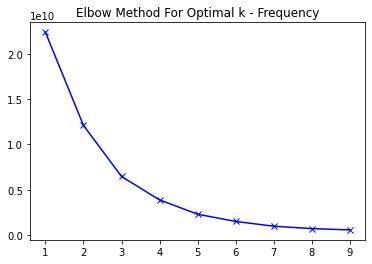

In [70]:
# Find optimal number of clusters

Sum_of_squared_distances_freq = []
K = range(1,10)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(mergedDf.values.reshape(-1,1))
    Sum_of_squared_distances_freq.append(km.inertia_)
    
plt.plot(K, Sum_of_squared_distances_freq, 'bx-')
plt.title('Elbow Method For Optimal k - Frequency')
plt.show()

Text(0, 0.5, 'Non seasonal orders')

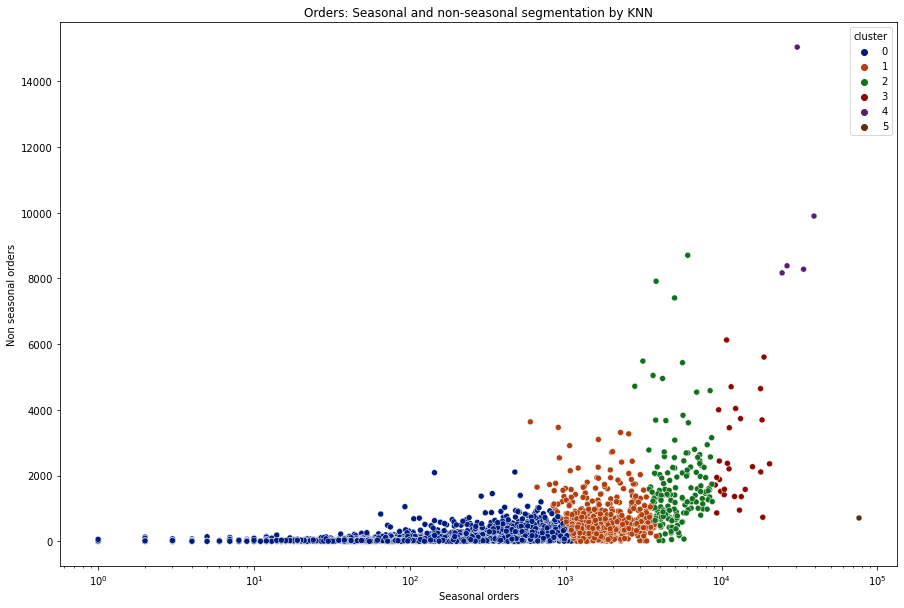

In [71]:
k = 6
kmeans = KMeans(n_clusters=k)
clustered_cust = kmeans.fit_predict(mergedDf[['IR_nonseasonal','IR_seasonal']])

# Ordering
idx = np.argsort(kmeans.cluster_centers_.sum(axis=1))
lut = np.zeros_like(idx)
lut[idx] = np.arange(k)
mergedDf['cluster'] = list(lut[kmeans.labels_])

plt.figure(figsize=(15,10))
g1 = sns.scatterplot(mergedDf['IR_nonseasonal'],mergedDf['IR_seasonal'],hue=mergedDf['cluster'],palette="dark")
g1.set_xscale("log")
plt.xlabel('Seasonal orders')
plt.title('Orders: Seasonal and non-seasonal segmentation by KNN')
plt.ylabel('Non seasonal orders')

In [72]:
print(mergedDf)

           IR_nonseasonal  IR_seasonal  cluster
StockCode                                      
10002                 285          116        0
10080                 200           91        0
10120                 121           61        0
10123C                  4            1        0
10124A                  8            8        0
...                   ...          ...      ...
90214N                  3           15        0
90214P                  3           25        0
90214R                  2           13        0
90214V                  1           13        0
90214Y                  1           60        0

[3129 rows x 3 columns]


In [73]:
df = pd.merge(df, mergedDf, left_on="StockCode", right_index=True)
df.drop(columns=["Seasonality","IR_nonseasonal","IR_seasonal"],inplace=True)
print(df.head(5))

     CustomerID InvoiceNo StockCode                         Description  \
0       17850.0    536365    85123A  WHITE HANGING HEART T-LIGHT HOLDER   
29      17850.0    536373    85123A  WHITE HANGING HEART T-LIGHT HOLDER   
46      17850.0    536375    85123A  WHITE HANGING HEART T-LIGHT HOLDER   
186     17511.0    536390    85123A  WHITE HANGING HEART T-LIGHT HOLDER   
228     13408.0    536394    85123A  WHITE HANGING HEART T-LIGHT HOLDER   

     Quantity         InvoiceDate  Individual Revenue OrderPeriod CohortGroup  \
0           6 2010-12-01 08:26:00                15.3     2010-12     2010-12   
29          6 2010-12-01 09:02:00                15.3     2010-12     2010-12   
46          6 2010-12-01 09:32:00                15.3     2010-12     2010-12   
186        64 2010-12-01 10:19:00               163.2     2010-12     2010-12   
228        32 2010-12-01 10:39:00                81.6     2010-12     2010-12   

     cluster  
0          4  
29         4  
46         4  
18

In [74]:
df["weeks"] = df["InvoiceDate"].dt.week
print(df)

        CustomerID InvoiceNo StockCode                         Description  \
0          17850.0    536365    85123A  WHITE HANGING HEART T-LIGHT HOLDER   
29         17850.0    536373    85123A  WHITE HANGING HEART T-LIGHT HOLDER   
46         17850.0    536375    85123A  WHITE HANGING HEART T-LIGHT HOLDER   
186        17511.0    536390    85123A  WHITE HANGING HEART T-LIGHT HOLDER   
228        13408.0    536394    85123A  WHITE HANGING HEART T-LIGHT HOLDER   
...            ...       ...       ...                                 ...   
342788     16440.0    580188     23496         PANTRY KITCHEN THERMOMETER    
346573     16873.0    580615     23496         PANTRY KITCHEN THERMOMETER    
347095     16910.0    580640     23496         PANTRY KITCHEN THERMOMETER    
352553     14204.0    581142     23496         PANTRY KITCHEN THERMOMETER    
353625     15453.0    581246     23496         PANTRY KITCHEN THERMOMETER    

        Quantity         InvoiceDate  Individual Revenue OrderP

In [75]:
week_df = df[["Quantity","cluster","weeks"]].groupby(["cluster","weeks"]).sum()

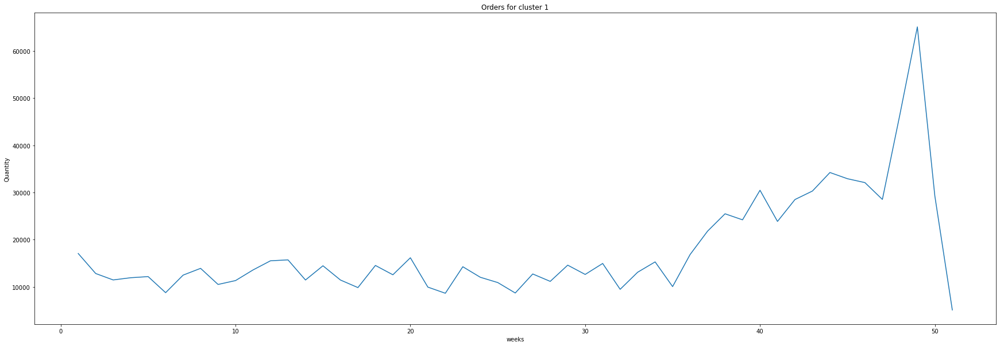

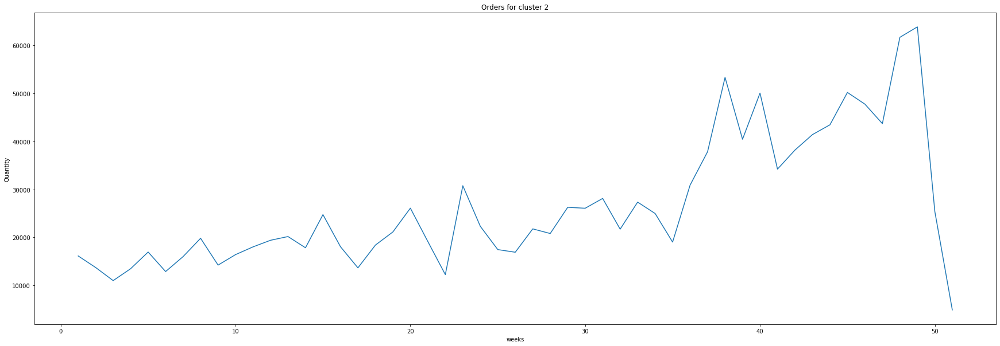

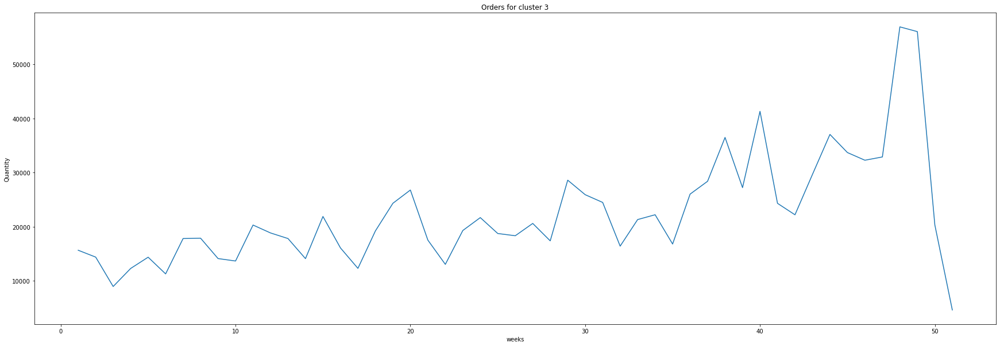

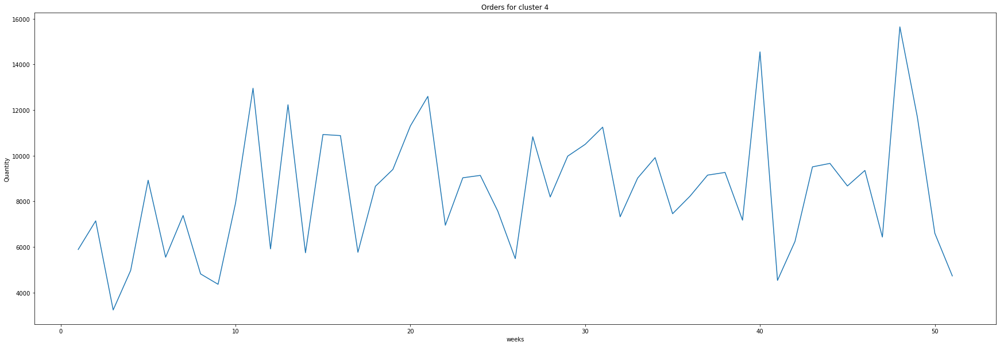

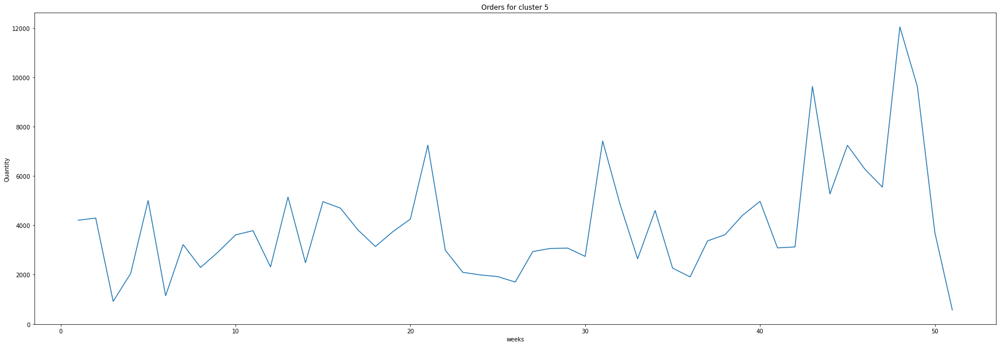

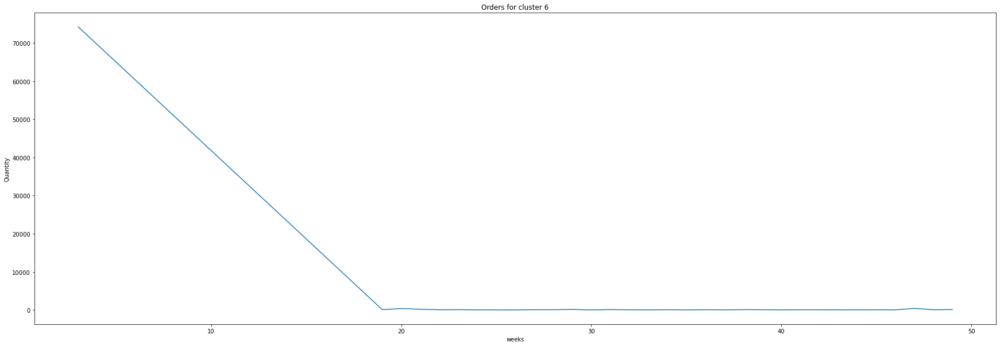

In [76]:
# Number of clusters defined earlier
clusters = np.arange(0,k,1)

for cluster in clusters:
    plt.figure(figsize=(30,10))
    sub_df = week_df.loc[cluster,:]
    sub_df.reset_index(inplace=True)
    
    sns.lineplot(data=sub_df, x="weeks", y="Quantity")
    plt.title("Orders for cluster "+ str(cluster+1))
    plt.show()

### Observations
- Cluster 1, Cluster 2, Cluster 3 and Cluster 5 are seasonal in nature. Hence, efforts for restocking them in large numbers must be undertaken mostly in the months of November and December
- Cluster 4 has a demand throughout the year. Hence, they need to be replinshed throughout
- Cluster 6 seems to be be in demand mostly in the month of January. 

In [77]:
# Products in cluster 6
print("Products in demand in the month of January: " + df[df.cluster==5]["Description"].unique()[0])


Products in demand in the month of January: MEDIUM CERAMIC TOP STORAGE JAR


In [78]:
fig = px.pie(df[df.cluster==3], values='Quantity', names="Description",\
             title="Distribution of orders for products sold throughout the year")
fig.update_layout(title_x=0.5)
fig.show()

## Conclusion - Inventory management

- Company can do their inventory management either by replinishing their stocks by the frequency of products being sold
- or prioritising the amount of products sold in seasonal or non-seasonal months

## Would appreciate to receive any feedback. Also upvote if you find the notebook useful